In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

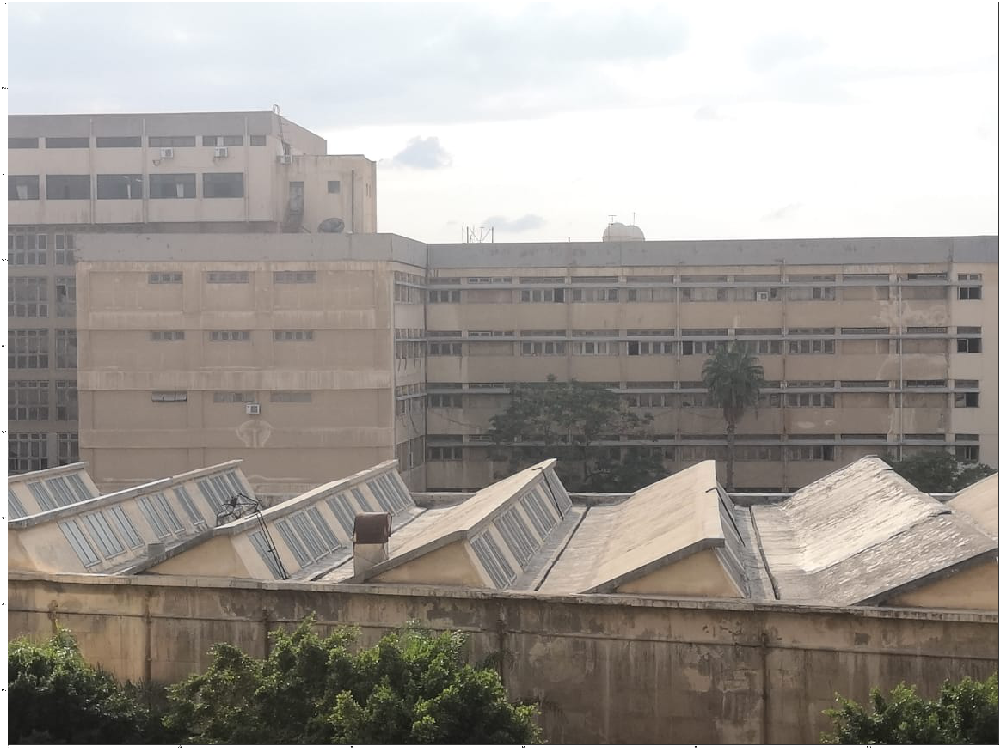

In [3]:
def show(img, size=75):
    plt.figure(figsize = (size,size))
    
    if len(img.shape) == 2: # if grayscale, set cmap
        plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    else: # if 3 channels, change from BGR to RGB
        plt.imshow(img[...,::-1])
        
    plt.show()

img = cv.imread("./image_mosaics_1.jpg")
show(img)

## Finding The KeyPoints Using SIFT

In [4]:
def get_keypoints(img):
    sift = cv.SIFT_create()
    kp, des = sift.detectAndCompute(img,None)
    img_keypoints=cv.drawKeypoints(img,kp,img)
#     show(img_keypoints, 8)
    return kp, des

## Finding Correspondence

In [5]:
# Return correspondences in the following format:
# [
#  pos in imgA, pos in imgB
#  [(x,y), (x,y)], # match 1
#  [(x,y), (x,y)] # match 2
#  ...
# ]

def get_correspondences(imgA, imgB):
    kp1, des1 = get_keypoints(imgA)
    kp2, des2 = get_keypoints(imgB)

    
    # BFMatcher with default params
    bf = cv.BFMatcher()
    
    # des1 = queryDescriptor, des2 = trainDescriptor
    matches = bf.knnMatch(des1,des2,k=2)
    
    # Apply ratio test
    good = []
    final_matches = []
    for m,n in matches:
        if m.distance < 0.235*n.distance:
            good.append([m])
            final_matches.append([kp1[m.queryIdx].pt, kp2[m.trainIdx].pt])
            
            
    # cv.drawMatchesKnn expects list of lists as matches.
    img3 = cv.drawMatchesKnn(imgA,kp1,imgB,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    show(img3)
    print(f"found {len(good)} matches")
    
    return final_matches

## Construct Homography Matrix

In [6]:
def construct_homography_matrix(matches):
    A = []
    
    for match in matches:
        xi = match[0][0]
        yi = match[0][1]
        
        xj = match[1][0]
        yj = match[1][1]
        
        A.append([xi, yi, 1, 0, 0, 0, -1*xj*xi, -1*xj*yi, -1*xj])
        A.append([0, 0, 0, xi, yi, 1, -1*yj*xi, -1*yj*yi, -1*yj])
            
    u, s, vh = np.linalg.svd(A, full_matrices=True)
    h = vh[-1]
    return np.array(h).reshape((3,3))

construct_homography_matrix([
    [(0,0), (0,0)],
    [(0,1), (0.5,1)],
    [(1,0), (2,0)],
    [(1,1), (1.5,1)],
])

array([[ 6.03022689e-01,  3.01511345e-01,  0.00000000e+00],
       [ 2.03042581e-16,  6.03022689e-01,  1.05969190e-17],
       [-6.46591136e-17,  3.01511345e-01,  3.01511345e-01]])

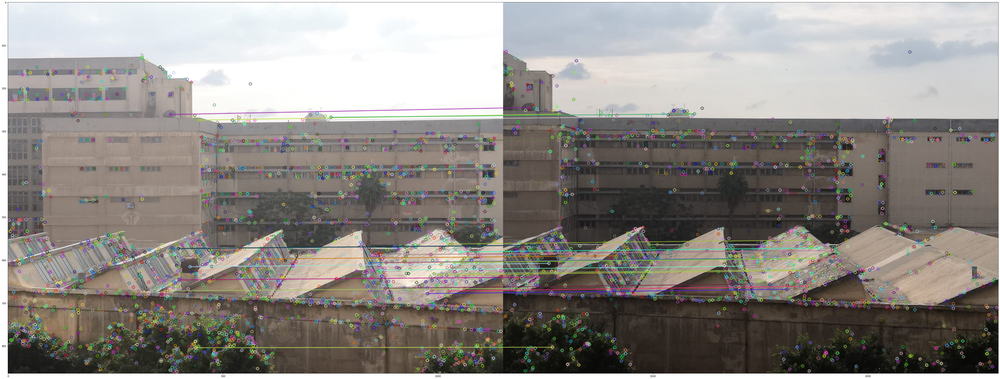

found 25 matches


In [7]:
imgA = cv.imread("./image_mosaics_1.jpg")
imgB = cv.imread("./image_mosaics_2.jpg")


correspondences = get_correspondences(imgA, imgB)
H = construct_homography_matrix(correspondences)

### Test Homography Matrix

(377.67724609375, 261.1460876464844)
[[377.67724609]
 [261.14608765]
 [  1.        ]]
[[377.67724609]
 [261.14608765]
 [  1.        ]]
[[ 61.17392488]
 [244.72665742]
 [  1.        ]]
(60.30052185058594, 244.6966094970703)


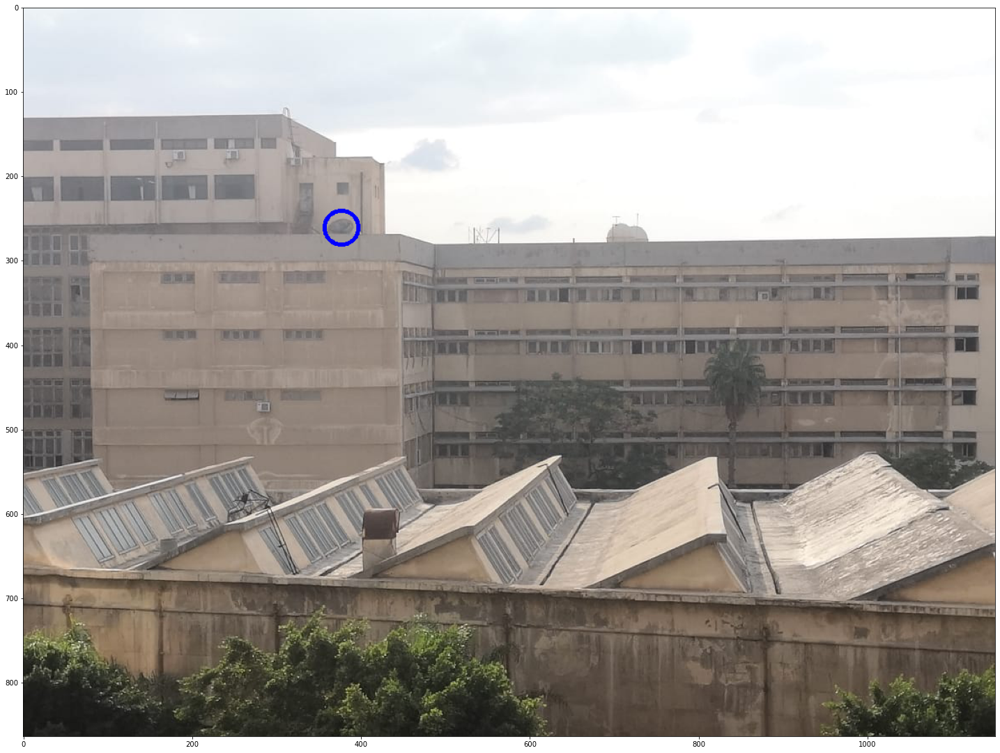

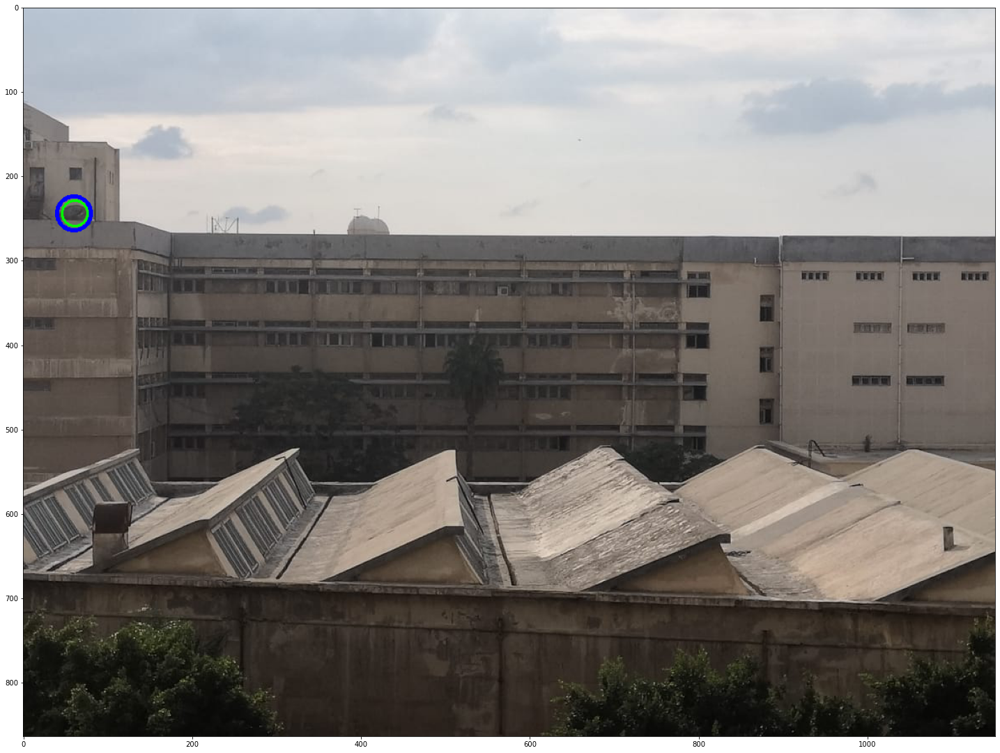

In [8]:
imgA = cv.imread("./image_mosaics_1.jpg")
imgB = cv.imread("./image_mosaics_2.jpg")

pointA = correspondences[1][0]
pointB = correspondences[1][1]


pointAHomogenousCoord = np.array([pointA[0], pointA[1], 1]).reshape((3,1))

print(pointA)
print(pointAHomogenousCoord)

pointA_ = np.matmul(H, pointAHomogenousCoord)
pointA_ /= pointA_[2][0]

print(pointAHomogenousCoord)
print(pointA_)
print(pointB)

imgA = cv.circle(imgA, (int(pointA[0]), int(pointA[1])), 20, (255,0,0), 4)
show(imgA, 25)

imgB = cv.circle(imgB, (int(pointB[0]), int(pointB[1])), 20, (255,0,0), 4)
imgB = cv.circle(imgB, (int(pointA_[0][0]), int(pointA_[1][0])), 15, (0,255,0), 2)
show(imgB, 25)

## Forward Warp

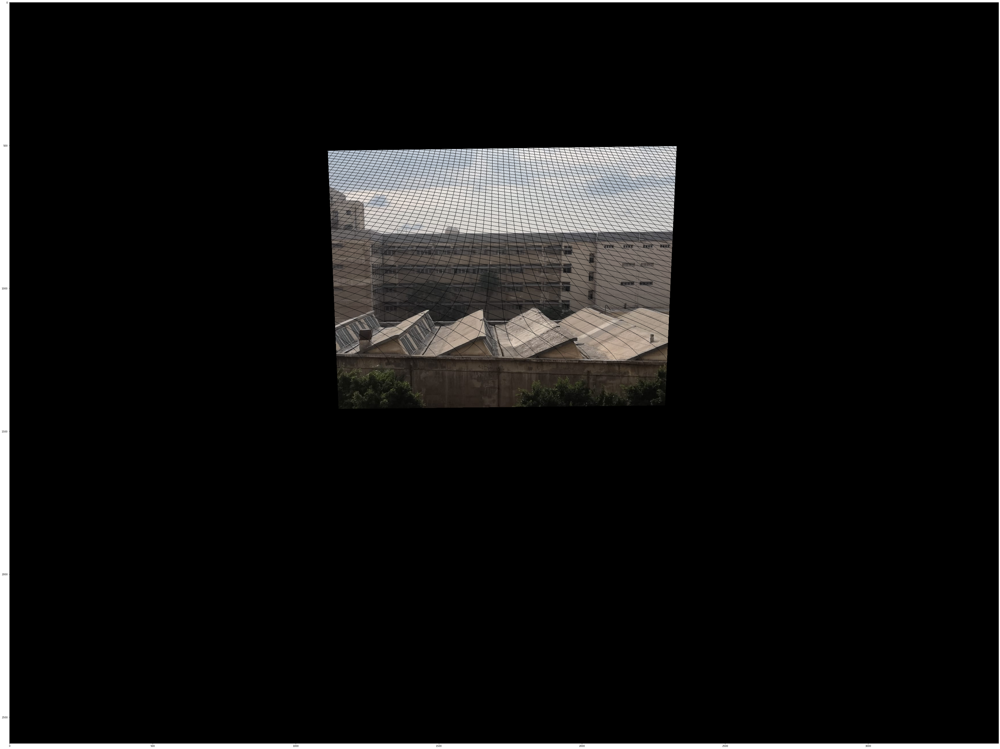

In [9]:
imgA = cv.imread("./image_mosaics_1.jpg")
imgB = cv.imread("./image_mosaics_2.jpg")


def warp(img, H):
    (height, width, depth) = img.shape
    
    height_offset = int(height)
    width_offset = int(width)
    final_img = np.zeros([height*3, width*3, depth], dtype=np.uint8)
    

    for i in range(height):
        for j in range(width):
            source = np.array([i,j,1]).reshape((3,1))
            
            destination = np.matmul(H, source)
            destination /= destination[2][0]
            destination = destination.astype(int)

            final_img[destination[0][0]+height_offset][destination[1][0]+width_offset] = img[i][j]
    return final_img
    
show(warp(imgB, H))

## Inverse Warp

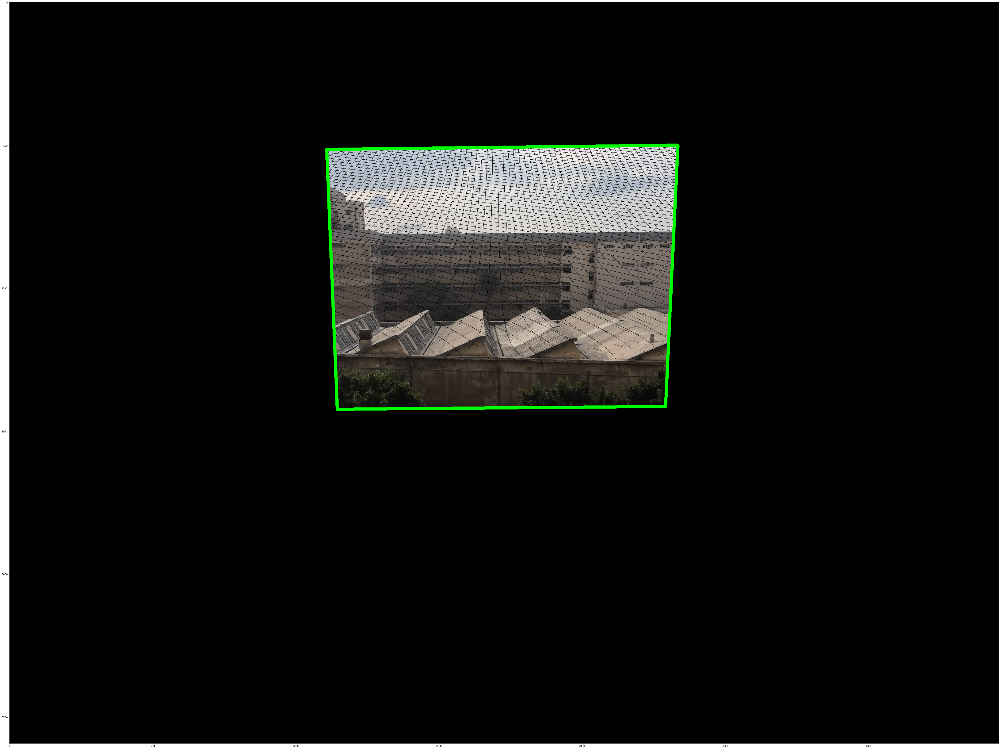

[[[2335  499]]

 [[2292 1413]]

 [[1145 1423]]

 [[1108  514]]]
Failed to inverse 75907, Succeeded 161


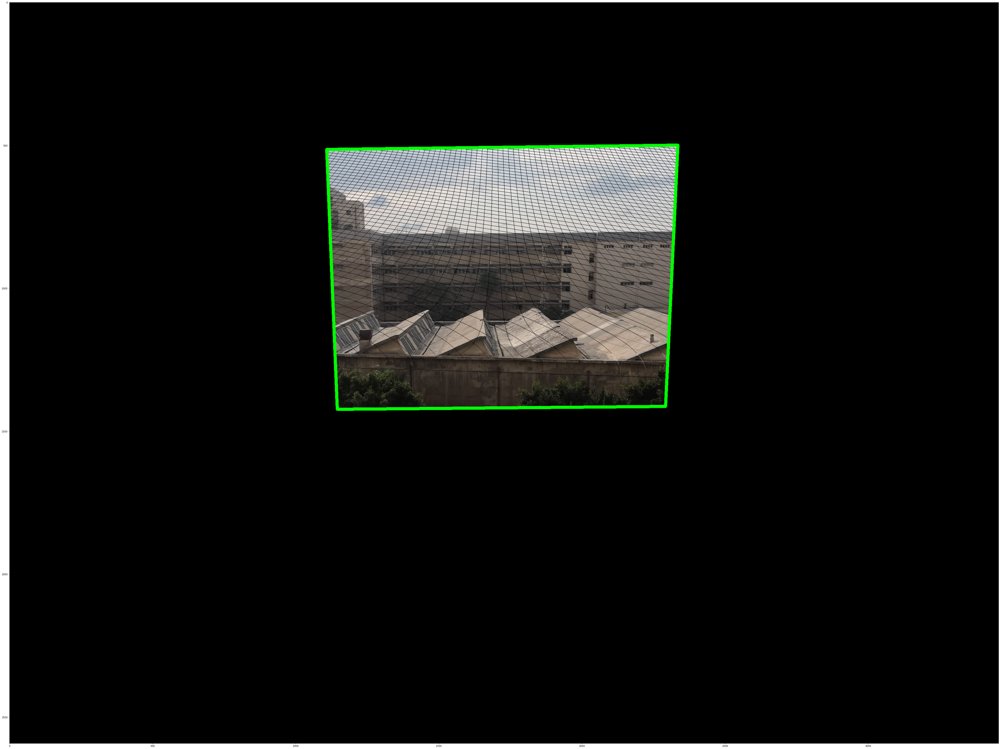

None


In [13]:
def get_bounding_poly(img):
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  gray = cv.blur(gray, (9,9))
  _, imagethreshold = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV)
  contours, _ = cv.findContours(imagethreshold, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
  
  biggestContour = max(contours, key = cv.contourArea)
  contours.remove(biggestContour)
  secondBiggestContour = max(contours, key = cv.contourArea)

  epsilon = 0.01 * cv.arcLength(secondBiggestContour, True)
  approximation = cv.approxPolyDP(secondBiggestContour, epsilon, True)
  cv.drawContours(img, [approximation], 0, (0,255,0), 10)
  show(img)
  return approximation

def linear_interpolation(pos, srcImg):
  return "TODO"

def inverse_warp(srcImg, warpedImg, H_inv):
  # Bounding box around warpedImg image
  (height, width, _) = warpedImg.shape
  contour = get_bounding_poly(warpedImg)
  print(contour)

  failed = 0
  success = 0

  for i in range(height):
    for j in range(width):
      norm = np.linalg.norm(warpedImg[i][j])
      if norm < 0.01 and cv.pointPolygonTest(contour, (j,i), False) >= 0:
        pos = np.array([i-height,j-width,1]).reshape((3,1))
        srcPos = np.matmul(H_inv, pos)
        srcPos /= srcPos[2][0]
        # TODO use linear interpolation
        try:
          warpedImg[i][j] = srcImg[int(srcPos[0][0])][int(srcPos[1][0])]
          success+=1

        except:
          failed += 1

  print(f"Failed to inverse {failed}, Succeeded {success}")

  show(warpedImg)
  


imgA = cv.imread("./image_mosaics_1.jpg")
imgB = cv.imread("./image_mosaics_2.jpg")

print(inverse_warp(imgA, warp(imgB, H), np.linalg.inv(H)))